<a href="https://colab.research.google.com/github/Bourennaneyounes/Access-control-by-Automatic-Number-Plate-Recognition/blob/main/matricules.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detection de plaques d'immatriculation

# 1-Data

-Les photos sont entièrement réelles.

-Les images ont une taille de 2448 x 3264 (haute résolution pour de meilleurs résultats)

-les images ont été prise dans différentes situations(intensité-éclairage-angles)

-apres la collection des images, ils ont été labelés sur l'application label img, lien : https://github.com/tzutalin/labelImg

un fichier .txt est généré pour chaque image.

-Ensuite la base d'images doit etre partitionné en test et train. 75% 25%, 687 pour le train et 224 pour le test

-La dataset est trandformée en .yaml à l'aide du site wandb : site ou on peut tracker les metrics et les trainings.

par la commande suivante : python utils/loggers/wandb/log_dataset.py --project custom_yolov5 --data data/custom_dataset.yaml







# 2-Yolov5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
#choisir la location du fichier
%cd /content/drive/MyDrive/yolo

/content/drive/.shortcut-targets-by-id/1Uj696NrivNBke4o3uedc2ACktEGmo6Ob/yolo


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#telecharger yolov5 depuis github
!git clone https://github.com/ultralytics/yolov5  # clone repo


In [ ]:
#installer les librairies necessaires
%cd /content/drive/MyDrive/yolo/yolov5
!pip install -r requirements.txt
!pip install wandb==0.12.10


In [ ]:
#transformer les données en format .yaml
!python utils/loggers/wandb/log_dataset.py --project matricules_project --data data/custom_dataset.yaml

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: 2
wandb: You chose 'Use an existing W&B account'
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: wandb version 0.13.2 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.12.10
wandb: Syncing run log dataset
wandb: ⭐️ View project at https://wandb.ai/soumer/matricules_project
wandb: 🚀 View run at https://wandb.ai/soumer/matricules_project/runs/1gon3wxq
wandb: Run data is saved locally in /content/drive/MyDrive/yolo/yolov5/wandb/run-20220905_044414-1gon3wxq
wandb: Run `wandb offline` to turn off syncing.

100% 755k/755k [00:00<00:00, 17.4MB/s]
Scanning '/content/drive/MyDrive/yolo/yolov5/custom_data

# Train


In [ ]:
%cd /content/drive/MyDrive/yolo/yolov5

/content/drive/.shortcut-targets-by-id/1SXS0ZYdfyEJeKVQ3ggs8_zK0jIuAF2-f/yolov5


In [ ]:
import wandb
wandb.login()

wandb: Currently logged in as: soumer (use `wandb login --relogin` to force relogin)


True

**Paramètres du train**


* `--project` : Le nom du projet
* `--upload_dataset` : Pour mettre à jour wandb par rapport aux résultats
* `--bbox_interval` : Intervals réguliers
* `--img` : Taille utilisée pour les images
* `--save_period`: Sauvegarder les epochs
* `--weights`: Type de yoloV5 utilisé : s, m, l ou x


In [ ]:
from typing_extensions import TypeVarTuple
#train the model
!python train.py \
  --data data/custom_dataset_wandb.yaml \
  --epochs 30 \
  --project matricules_project \
  --bbox_interval 1 \
  --save-period 1 \
  --weights yolov5s.pt\
  --cache

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 2
wandb: You chose 'Use an existing W&B account'
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
train: weights=yolov5s.pt, cfg=, data=data/custom_dataset_wandb.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=matricules_project, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=1, local_rank=-1, entity=None, upload_dataset=Fal

In [ ]:
%cd /content/drive/MyDrive/yolo/yolov5
!python val.py --weights matricule_model.pt

/content/drive/MyDrive/yolo/yolov5
val: data=data/custom_dataset.yaml, weights=['matricule_model.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-261-g19f33cb Python-3.7.13 torch-1.12.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7053277 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning '/content/drive/MyDrive/yolo/yolov5/custom_dataset/val.cache' images and labels... 224 found, 0 missing, 0 empty, 0 corrupt: 100% 224/224 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 7/7 [01:57<00:00, 16.79s/it]
                 all        224        250      0.944      0.956      0.961      0.634
           matricule        224        250      0.944      0.956      0.961      0.634
Speed

In [ ]:
#affichage de plusieurs images---------------------------------------------------------------------------
import cv2
import matplotlib.pyplot as plt
def show_multiple_images(images, columns,rows,sizeX,sizeY):
    fig = plt.figure(figsize=(sizeX, sizeY))
    for i in range(0, columns*rows ):
        fig.add_subplot(rows, columns, i+1)
        plt.imshow(images[i], cmap='gray')
    plt.show()
#affichage des résultats de test---------------------------------------------------------------------------
Images=[]
for i in range(0,3):
  i1=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/val/exp4/val_batch'+str(i)+'_labels.jpg')
  i2=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/val/exp4/val_batch'+str(i)+'_pred.jpg')
  Images.append(i1)
  Images.append(i2)

# show_multiple_images(Images,3,1,60,60)

In [ ]:
#visualiser les résultats sous forme de rapports à partir du site wandb
import wandb
wandb.login()
api = wandb.Api()       #"utilisateur","nom du projet","id du run"
team, project, run_id = "soumer", "matricules_project", "3pod3g6d"
run = api.run(f"{team}/{project}/{run_id}")
run.display(height=1080)

wandb: Currently logged in as: soumer (use `wandb login --relogin` to force relogin)
/usr/local/lib/python3.7/dist-packages/IPython/core/display.py:701: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


True

In [ ]:
#detection de matricules sur 40 images et enregistrer les resultats dans drive -->images modeles
#le modele de detection a ete telechargé depuis wandb.com apres le train(Matricules.pt)

%cd /content/drive/MyDrive/yolo/yolov5
from IPython.display import Image
!python detect.py --save-crop --weights matricule_model.pt --img 640 --conf 0.25 --source data/Images_modeles


#Prepare data

In [ ]:
!pip install --upgrade opencv-python
!pip install --upgrade opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%cd /content/drive/MyDrive/yolo/yolov5
#lire les resultats depuis drive-----------------------------------------------------------------------------
import cv2
from IPython.display import Image, clear_output
img=[]
mat=[]
mat_for_hog=[]

for i in range(1,71):
  detected_mat=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp/'+str(i)+'.jpg')#Resultats de la detection
  extracted_mat=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp/crops/matricule/'+str(i)+'.jpg')#matricules resultant de la detection
  extracted_mat_for_hog=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp/crops/matricule/'+str(i)+'.jpg')#matricules resultant de la detection
  img.append(detected_mat)
  mat.append(extracted_mat)
  mat_for_hog.append(extracted_mat_for_hog)


/content/drive/.shortcut-targets-by-id/1Uj696NrivNBke4o3uedc2ACktEGmo6Ob/yolo/yolov5


In [ ]:
#affichage des résultats de detection---------------------------------------------------
show_multiple_images(img,10,7,60,60)

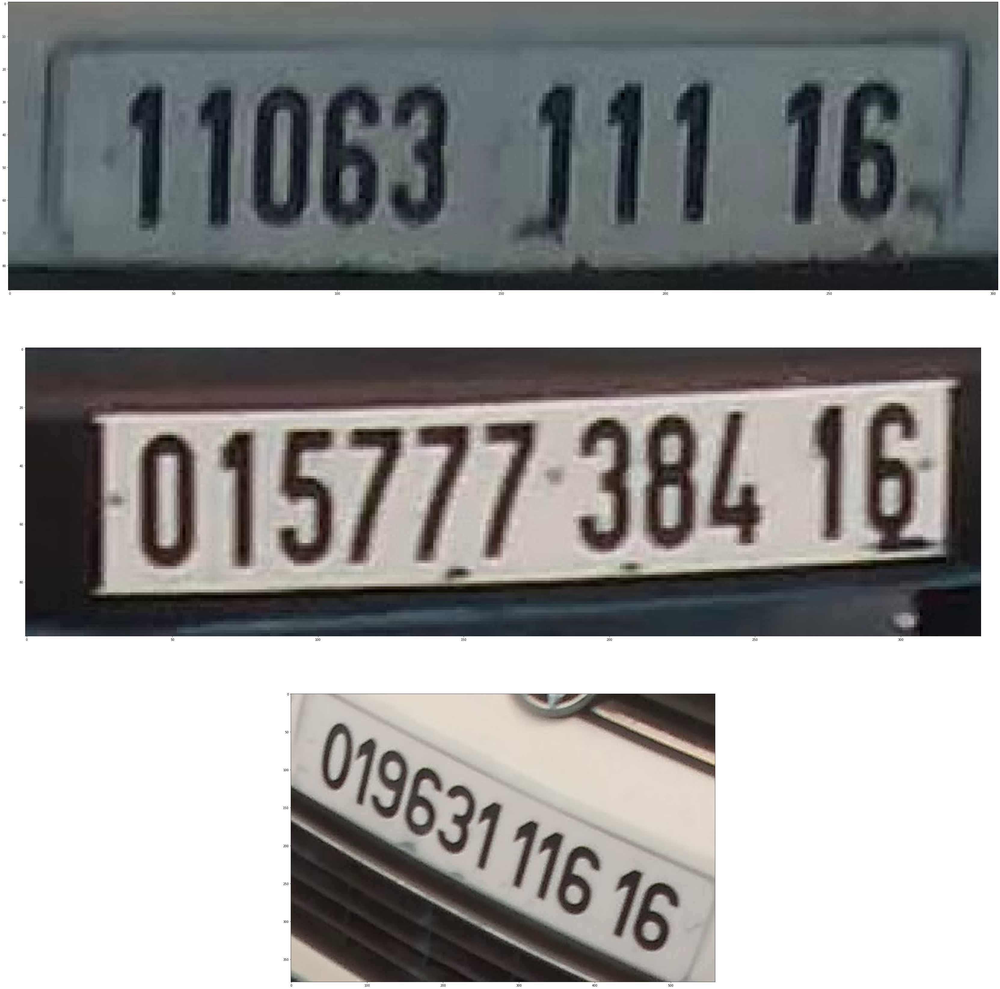

In [ ]:
#affichage les matricules détectés---------------------------------------------------
show_multiple_images(mat_for_hog,1,3,60,60)

#3-Algorithme SIFT pour la reconnaissance de véhicules

In [ ]:
#appliquer sift pour l'ensemble d'images------------------------------------------------------------
ims=[]
key=[]
des=[]
grays=[]
coordinates=[]
#fonction pour extraire et afficher les points clés d'une image-------------------------------------
def get_keypoints(matricule):
  sift = cv2.SIFT_create()
  gray=cv2.cvtColor(matricule,cv2.COLOR_RGB2GRAY)
  keypoints_1, descriptors_1 = sift.detectAndCompute(matricule,None)
  img_1 = cv2.drawKeypoints(matricule,keypoints_1,matricule)
  return img_1 ,keypoints_1, descriptors_1,gray



In [ ]:
#fonction pour extraire les coordonnées des points clés d'une image---------------------------------
def get_positions(keypoints):
  pts = [p.pt for p in keypoints]
  return pts

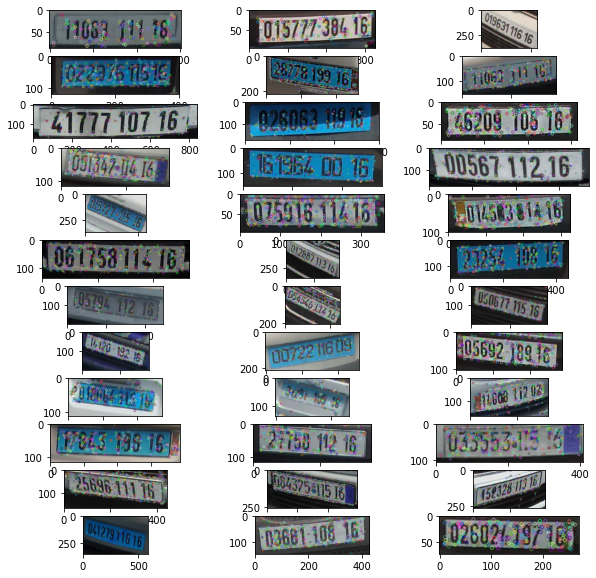

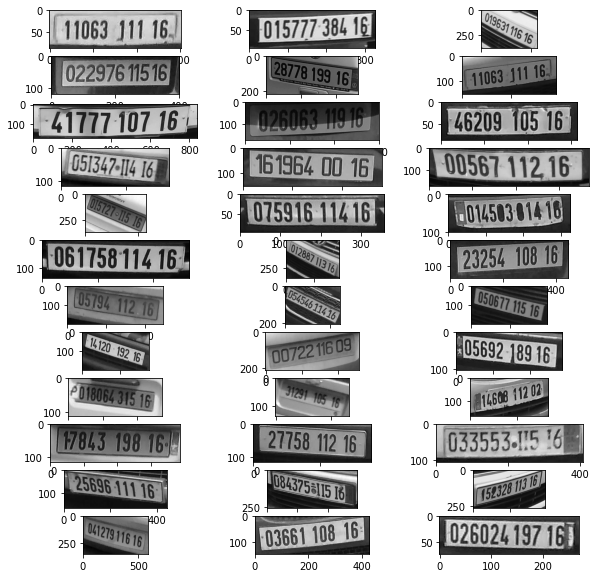

In [ ]:
#application pour les images modeles----------------------------------------------------------------
for j in range(len(mat)):
  img_1,keypoints_1,descriptors_1,gray=get_keypoints(mat[j])
  keypoints_coordinates=get_positions(keypoints_1)
  grays.append(gray)
  key.append(keypoints_1)
  des.append(descriptors_1)
  ims.append(img_1)
 # coordinates.append(keypoints_coordinates)
show_multiple_images(ims,3,12,10,10)
show_multiple_images(grays,3,12,10,10)

In [ ]:
#detecter le matricule pour les images de comparaison
%cd /content/drive/MyDrive/yolo/yolov5

!python detect.py --save-crop --weights matricule_model.pt --img 640 --conf 0.25 --source data/Images_requetes


In [ ]:

mat2=[]
mat2_for_hog=[]
for D in range(1,71):
  extracted_mat=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/crops/matricule/'+str(D)+'.jpg')#matricules resultant de la detection
  extracted_mat_for_hog=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp2/crops/matricule/'+str(D)+'.jpg')#matricules resultant de la detection
  mat2.append(extracted_mat)
  mat2_for_hog.append(extracted_mat_for_hog)

# show_multiple_images(mat2,3,12,60,60)
#detected=cv2.imread('/content/drive/MyDrive/yolo/yolov5/runs/detect/exp40/crops/matricule/3.jpg')#-->true


In [ ]:
show_multiple_images(mat2,10,7,60,60)

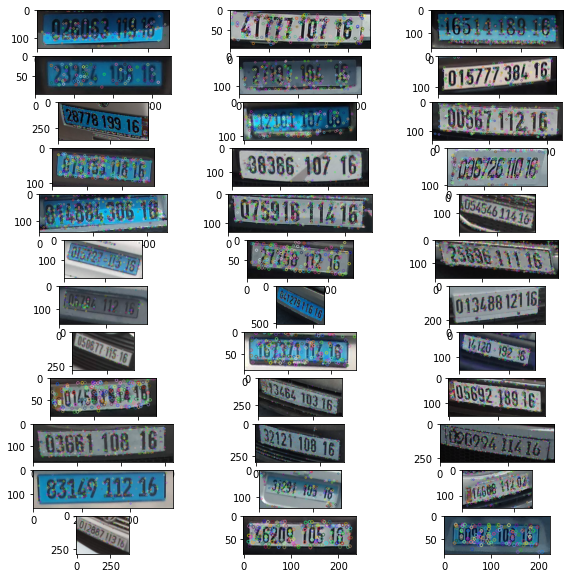

In [ ]:
#appliquer sift pour les images requetes(pour tester chacune d'entre elles)
ims2=[]
key2=[]
des2=[]
grays2=[]


for D in range(len(mat2)):
  img_2,keypoints_2,descriptors_2,gray2=get_keypoints(mat2[D])
  grays2.append(gray2)
  key2.append(keypoints_2)
  des2.append(descriptors_2)
  ims2.append(img_2)
 # coordinates.append(keypoints_coordinates)
show_multiple_images(ims2,3,12,10,10)



In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt


'''filtre 1------------------------------------------------------------------------------'''
def sift_matching(des_1,des_2,key_1,key_2,gray_1,gray_2):
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_1,des_2,k=2)
    good_matches = []
    for m,n in matches:
        if m.distance < 0.4*n.distance:#David Lowe ratio
            good_matches.append(m)
    return good_matches
def maximum_list(liste):
    maximum = max([len(i) for i in liste])
    lens = [len(val) for val in liste]
    index=lens.index(max(lens))
    return maximum,index

In [ ]:
'''filtre 2--------------------------------------------------------------------------------'''
def homography_test(des_1,des_2,key_1,key_2,gray_1,gray_2,good_matches,max_match):
    MIN_MATCH_COUNT = 5
    check=False
    if len(good_matches)>MIN_MATCH_COUNT and (len(good_matches)==max_match):
        src_pts = np.float32([ key_1[m.queryIdx].pt for m in good_matches  ]).reshape(-1,1,2)
        dst_pts = np.float32([ key_2[m.trainIdx].pt for m in good_matches  ]).reshape(-1,1,2)
        M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()
        h,w = gray_1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        #dst = cv.perspectiveTransform(pts,M)
        #result = cv2.polylines(gray_2 ,[np.int32(dst)],True, 255,cv2.LINE_AA)#draw rectangle
        draw_params = dict(matchColor = (0,255,0), # dessiner en vert
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 2)
        result_image = cv.drawMatches(gray_1,key_1,gray_2,key_2,good_matches,None,**draw_params)
        plt.figure(figsize = (20,2))
        plt.imshow(result_image, 'gray'),plt.show()
        print( "matches found are  - {}/{}".format(len(good_matches), MIN_MATCH_COUNT) )
        check=True
    else:
        print( "Not enough matches are found - {}/{} !!!!!!!".format(len(good_matches), MIN_MATCH_COUNT) )
        matchesMask = None
    return check

---------------------------------------------------------test0------------------------------------------------------------------


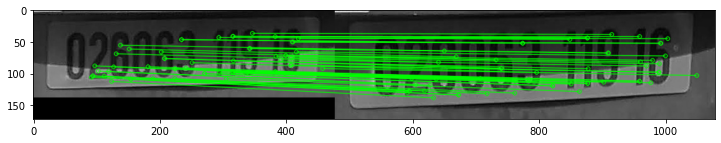

matches found are  - 56/5
l'image requete 1 Correspond à l'image modele 8
---------------------------------------------------------test1------------------------------------------------------------------


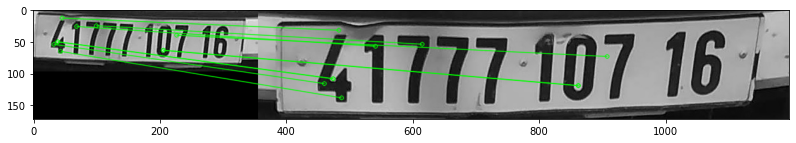

matches found are  - 16/5
l'image requete 2 Correspond à l'image modele 7
---------------------------------------------------------test2------------------------------------------------------------------
Not enough matches are found - 3/5 !!!!!!!
---------------------------------------------------------test3------------------------------------------------------------------


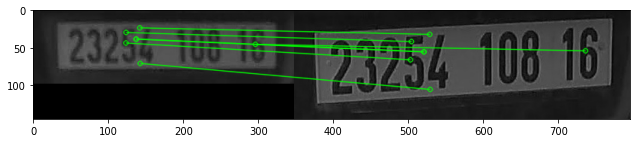

matches found are  - 7/5
l'image requete 4 Correspond à l'image modele 18
---------------------------------------------------------test4------------------------------------------------------------------
Not enough matches are found - 3/5 !!!!!!!
---------------------------------------------------------test5------------------------------------------------------------------


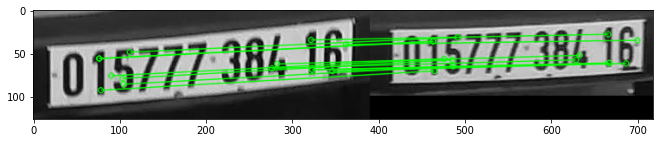

matches found are  - 15/5
l'image requete 6 Correspond à l'image modele 2
---------------------------------------------------------test6------------------------------------------------------------------


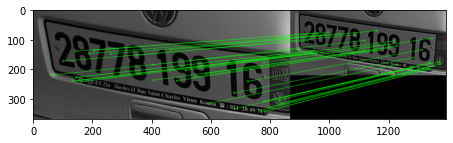

matches found are  - 35/5
l'image requete 7 Correspond à l'image modele 5
---------------------------------------------------------test7------------------------------------------------------------------
Not enough matches are found - 1/5 !!!!!!!
---------------------------------------------------------test8------------------------------------------------------------------


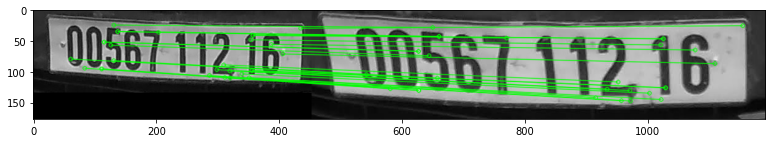

matches found are  - 35/5
l'image requete 9 Correspond à l'image modele 12
---------------------------------------------------------test9------------------------------------------------------------------


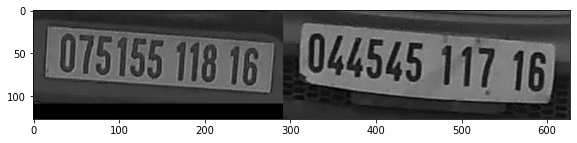

matches found are  - 7/5
l'image requete 10 Correspond à l'image modele 58
---------------------------------------------------------test10------------------------------------------------------------------


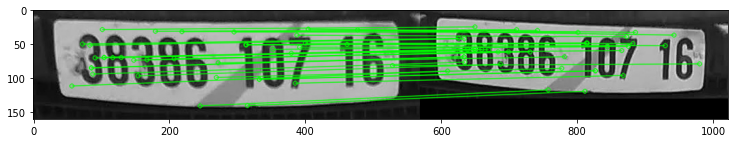

matches found are  - 39/5
l'image requete 11 Correspond à l'image modele 52
---------------------------------------------------------test11------------------------------------------------------------------
Not enough matches are found - 4/5 !!!!!!!
---------------------------------------------------------test12------------------------------------------------------------------


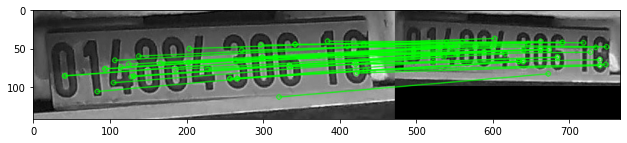

matches found are  - 41/5
l'image requete 13 Correspond à l'image modele 45
---------------------------------------------------------test13------------------------------------------------------------------


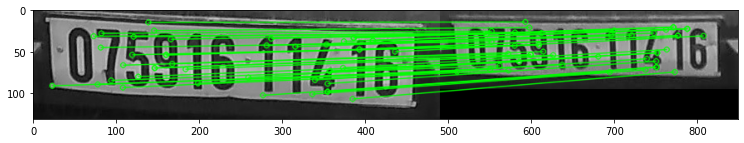

matches found are  - 46/5
l'image requete 14 Correspond à l'image modele 14
---------------------------------------------------------test14------------------------------------------------------------------


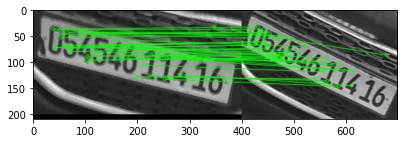

matches found are  - 44/5
l'image requete 15 Correspond à l'image modele 20
---------------------------------------------------------test15------------------------------------------------------------------


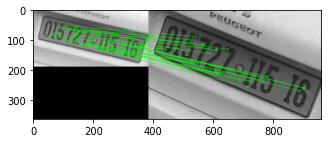

matches found are  - 34/5
l'image requete 16 Correspond à l'image modele 13
---------------------------------------------------------test16------------------------------------------------------------------


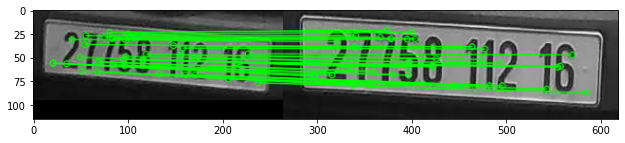

matches found are  - 38/5
l'image requete 17 Correspond à l'image modele 29
---------------------------------------------------------test17------------------------------------------------------------------


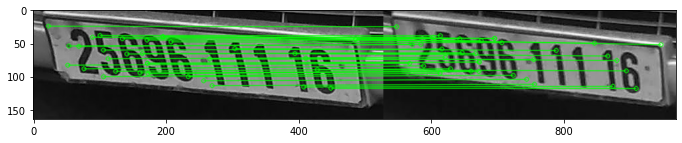

matches found are  - 34/5
l'image requete 18 Correspond à l'image modele 31
---------------------------------------------------------test18------------------------------------------------------------------


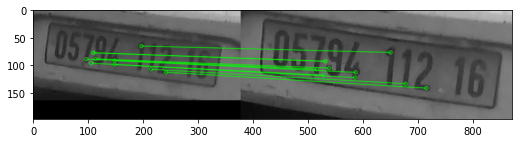

matches found are  - 12/5
l'image requete 19 Correspond à l'image modele 19
---------------------------------------------------------test19------------------------------------------------------------------


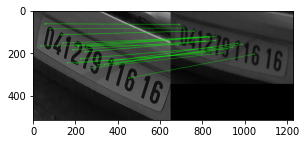

matches found are  - 33/5
l'image requete 20 Correspond à l'image modele 34
---------------------------------------------------------test20------------------------------------------------------------------


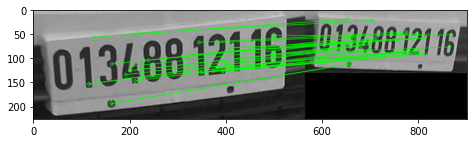

matches found are  - 37/5
l'image requete 21 Correspond à l'image modele 57
---------------------------------------------------------test21------------------------------------------------------------------


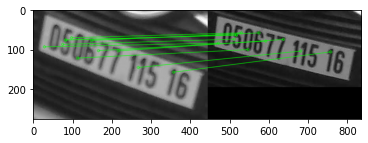

matches found are  - 11/5
l'image requete 22 Correspond à l'image modele 21
---------------------------------------------------------test22------------------------------------------------------------------


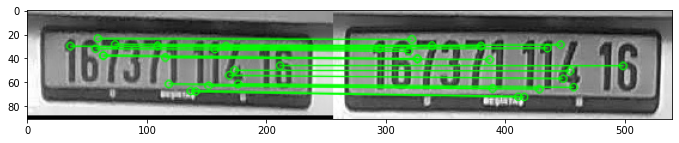

matches found are  - 21/5
l'image requete 23 Correspond à l'image modele 61
---------------------------------------------------------test23------------------------------------------------------------------


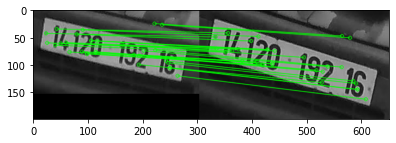

matches found are  - 30/5
l'image requete 24 Correspond à l'image modele 22
---------------------------------------------------------test24------------------------------------------------------------------


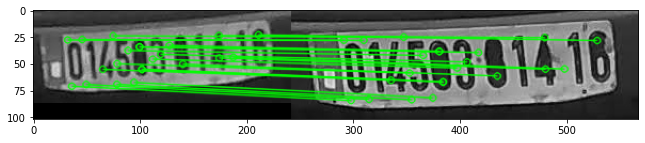

matches found are  - 23/5
l'image requete 25 Correspond à l'image modele 15
---------------------------------------------------------test25------------------------------------------------------------------


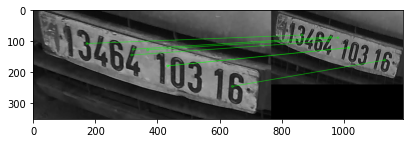

matches found are  - 8/5
l'image requete 26 Correspond à l'image modele 51
---------------------------------------------------------test26------------------------------------------------------------------


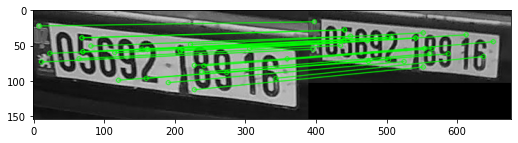

matches found are  - 26/5
l'image requete 27 Correspond à l'image modele 24
---------------------------------------------------------test27------------------------------------------------------------------


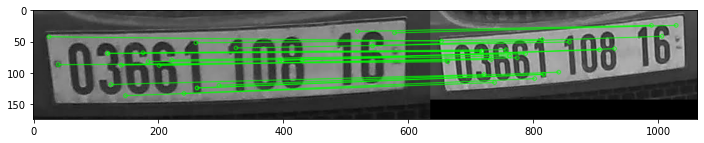

matches found are  - 25/5
l'image requete 28 Correspond à l'image modele 35
---------------------------------------------------------test28------------------------------------------------------------------


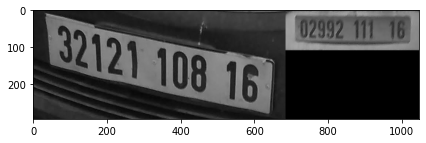

matches found are  - 9/5
l'image requete 29 Correspond à l'image modele 65
---------------------------------------------------------test29------------------------------------------------------------------


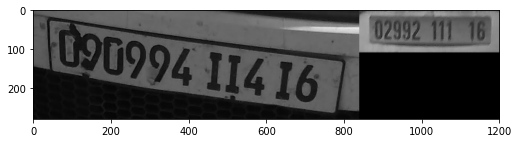

matches found are  - 13/5
l'image requete 30 Correspond à l'image modele 65
---------------------------------------------------------test30------------------------------------------------------------------
Not enough matches are found - 4/5 !!!!!!!
---------------------------------------------------------test31------------------------------------------------------------------


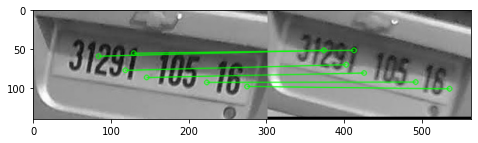

matches found are  - 6/5
l'image requete 32 Correspond à l'image modele 26
---------------------------------------------------------test32------------------------------------------------------------------


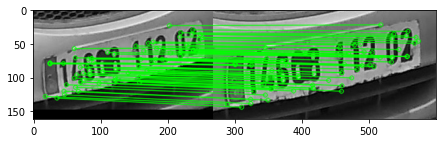

matches found are  - 73/5
l'image requete 33 Correspond à l'image modele 27
---------------------------------------------------------test33------------------------------------------------------------------


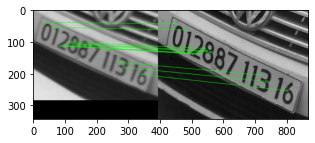

matches found are  - 12/5
l'image requete 34 Correspond à l'image modele 17
---------------------------------------------------------test34------------------------------------------------------------------


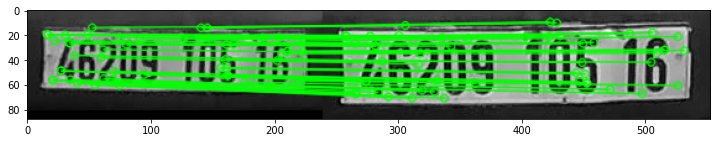

matches found are  - 51/5
l'image requete 35 Correspond à l'image modele 9
---------------------------------------------------------test35------------------------------------------------------------------


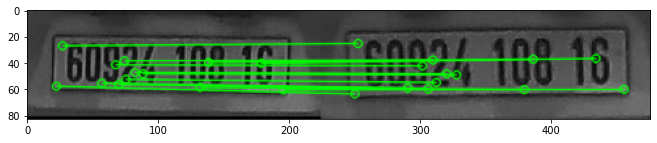

matches found are  - 13/5
l'image requete 36 Correspond à l'image modele 39
---------------------------------------------------------test36------------------------------------------------------------------
Not enough matches are found - 1/5 !!!!!!!
---------------------------------------------------------test37------------------------------------------------------------------


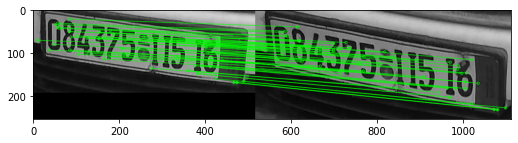

matches found are  - 62/5
l'image requete 38 Correspond à l'image modele 32
---------------------------------------------------------test38------------------------------------------------------------------


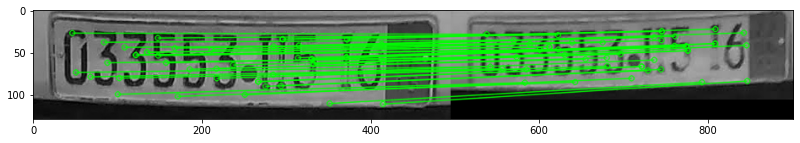

matches found are  - 46/5
l'image requete 39 Correspond à l'image modele 30
---------------------------------------------------------test39------------------------------------------------------------------


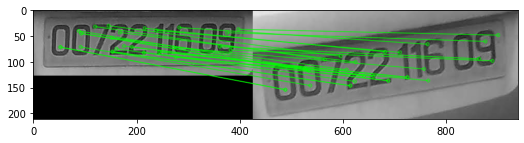

matches found are  - 30/5
l'image requete 40 Correspond à l'image modele 23
---------------------------------------------------------test40------------------------------------------------------------------


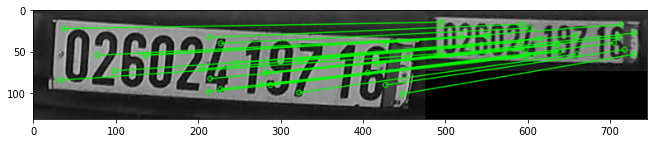

matches found are  - 25/5
l'image requete 41 Correspond à l'image modele 36
---------------------------------------------------------test41------------------------------------------------------------------


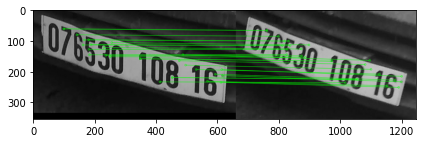

matches found are  - 34/5
l'image requete 42 Correspond à l'image modele 54
---------------------------------------------------------test42------------------------------------------------------------------


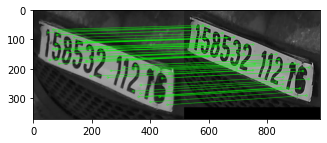

matches found are  - 54/5
l'image requete 43 Correspond à l'image modele 55
---------------------------------------------------------test43------------------------------------------------------------------


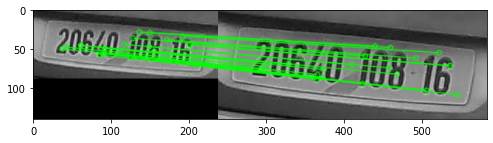

matches found are  - 21/5
l'image requete 44 Correspond à l'image modele 56
---------------------------------------------------------test44------------------------------------------------------------------


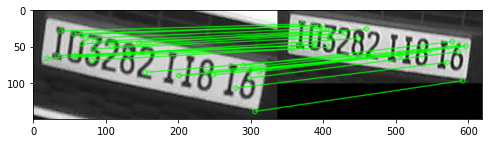

matches found are  - 28/5
l'image requete 45 Correspond à l'image modele 42
---------------------------------------------------------test45------------------------------------------------------------------


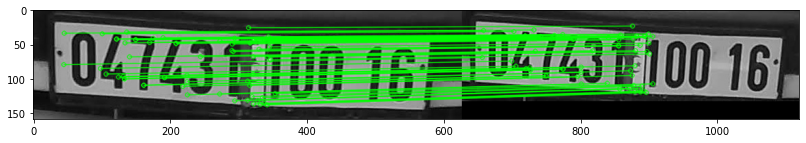

matches found are  - 82/5
l'image requete 46 Correspond à l'image modele 49
---------------------------------------------------------test46------------------------------------------------------------------


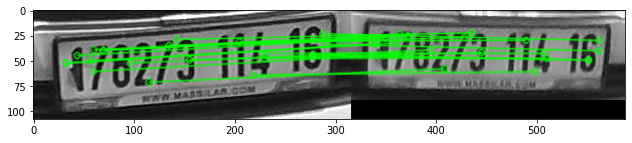

matches found are  - 21/5
l'image requete 47 Correspond à l'image modele 43
---------------------------------------------------------test47------------------------------------------------------------------


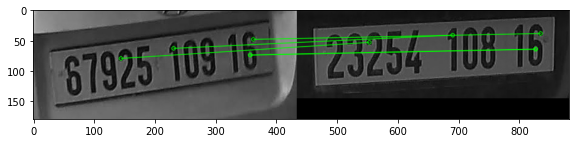

matches found are  - 10/5
l'image requete 48 Correspond à l'image modele 18
---------------------------------------------------------test48------------------------------------------------------------------
Not enough matches are found - 2/5 !!!!!!!
---------------------------------------------------------test49------------------------------------------------------------------


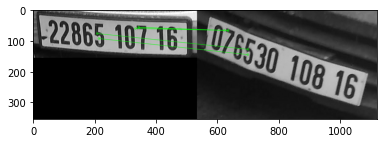

matches found are  - 9/5
l'image requete 50 Correspond à l'image modele 54
---------------------------------------------------------test50------------------------------------------------------------------


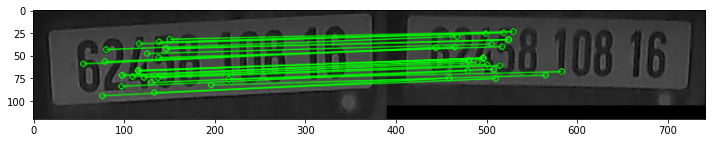

matches found are  - 28/5
l'image requete 51 Correspond à l'image modele 66
---------------------------------------------------------test51------------------------------------------------------------------


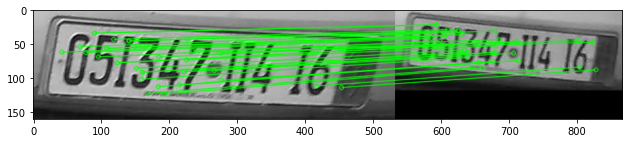

matches found are  - 36/5
l'image requete 52 Correspond à l'image modele 10
---------------------------------------------------------test52------------------------------------------------------------------


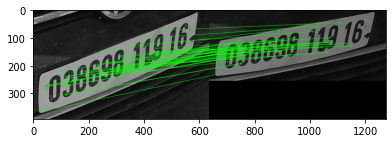

matches found are  - 55/5
l'image requete 53 Correspond à l'image modele 53
---------------------------------------------------------test53------------------------------------------------------------------


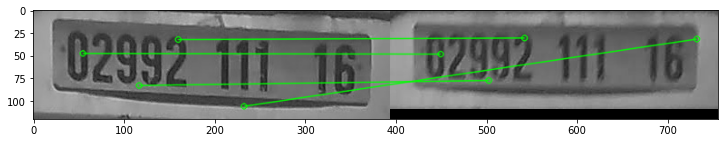

matches found are  - 6/5
l'image requete 54 Correspond à l'image modele 65
---------------------------------------------------------test54------------------------------------------------------------------


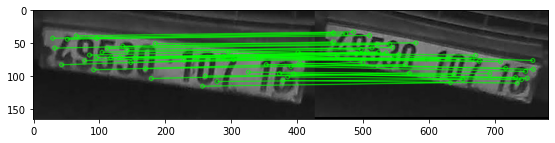

matches found are  - 39/5
l'image requete 55 Correspond à l'image modele 62
---------------------------------------------------------test55------------------------------------------------------------------
Not enough matches are found - 1/5 !!!!!!!
---------------------------------------------------------test56------------------------------------------------------------------


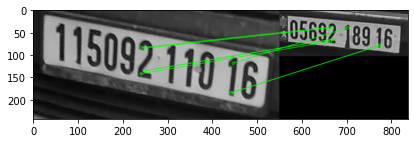

matches found are  - 8/5
l'image requete 57 Correspond à l'image modele 24
---------------------------------------------------------test57------------------------------------------------------------------


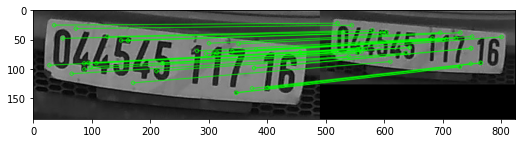

matches found are  - 37/5
l'image requete 58 Correspond à l'image modele 58
---------------------------------------------------------test58------------------------------------------------------------------


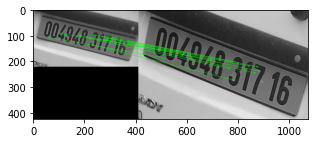

matches found are  - 12/5
l'image requete 59 Correspond à l'image modele 60
---------------------------------------------------------test59------------------------------------------------------------------


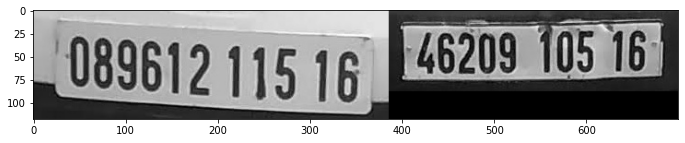

matches found are  - 6/5
l'image requete 60 Correspond à l'image modele 9
---------------------------------------------------------test60------------------------------------------------------------------


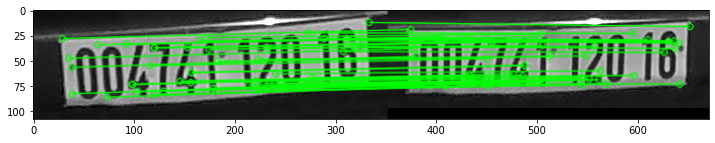

matches found are  - 47/5
l'image requete 61 Correspond à l'image modele 46
---------------------------------------------------------test61------------------------------------------------------------------


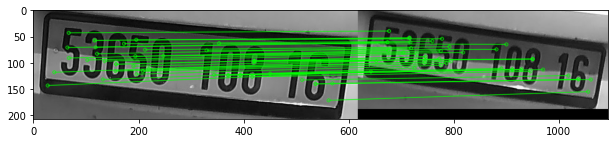

matches found are  - 44/5
l'image requete 62 Correspond à l'image modele 67
---------------------------------------------------------test62------------------------------------------------------------------


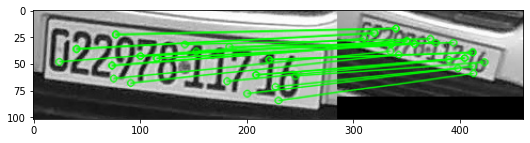

matches found are  - 25/5
l'image requete 63 Correspond à l'image modele 59
---------------------------------------------------------test63------------------------------------------------------------------


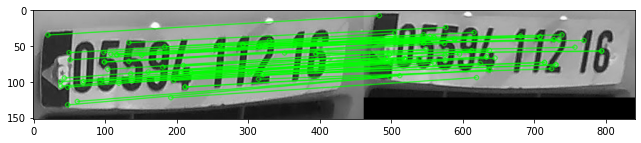

matches found are  - 59/5
l'image requete 64 Correspond à l'image modele 41
---------------------------------------------------------test64------------------------------------------------------------------


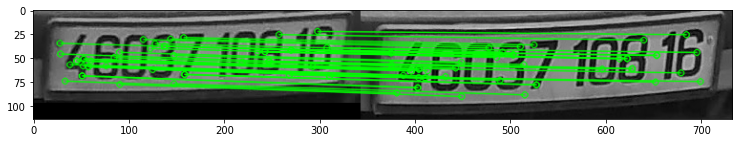

matches found are  - 45/5
l'image requete 65 Correspond à l'image modele 44
---------------------------------------------------------test65------------------------------------------------------------------
Not enough matches are found - 2/5 !!!!!!!
---------------------------------------------------------test66------------------------------------------------------------------


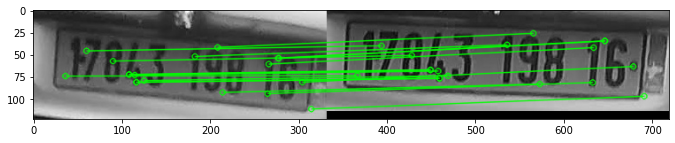

matches found are  - 18/5
l'image requete 67 Correspond à l'image modele 28
---------------------------------------------------------test67------------------------------------------------------------------


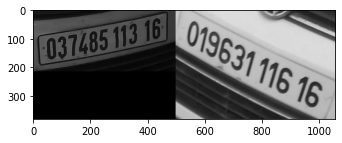

matches found are  - 9/5
l'image requete 68 Correspond à l'image modele 3
---------------------------------------------------------test68------------------------------------------------------------------


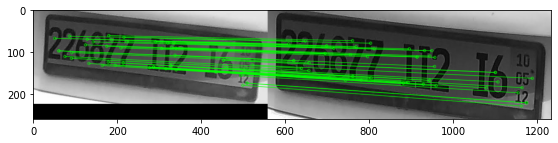

matches found are  - 49/5
l'image requete 69 Correspond à l'image modele 37
---------------------------------------------------------test69------------------------------------------------------------------


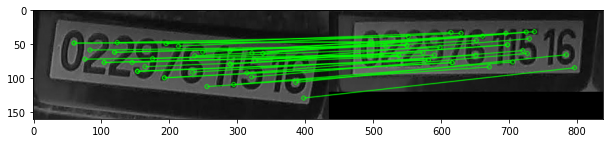

matches found are  - 33/5
l'image requete 70 Correspond à l'image modele 4


In [ ]:
'''Application--------------------------------------------------------------------------------'''

for S in range (len(des2)):
    matches=[]
    print("---------------------------------------------------------test"+str(S)+"------------------------------------------------------------------")
    for k in range(len(des)):
        good_m=sift_matching(des2[S],des[k],key2[S],key[k],grays2[S],grays[k])
        matches.append(good_m)

    max_len,index=maximum_list(matches)
    check_img=homography_test(des2[S],des[index],key2[S],key[index],grays2[S],grays[index],matches[index],max_len)
    if check_img==True:
      print("l'image requete "+str(S+1)+" Correspond à l'image modele "+str(index+1))

#3.1- Résultat SIFT
Taux de réussite SIFT=0.9

In [ ]:
test1=cv2.imread('/content/drive/MyDrive/yolo/yolov5/A1.png',0)
test2=cv2.imread('/content/drive/MyDrive/yolo/yolov5/A2.png',0)
plt.figure(figsize = (20,2))
plt.imshow(test1),plt.show()
plt.figure(figsize = (20,2))
plt.imshow(test2),plt.show()
MIN_MATCH_COUNT = 10
# Initiate SIFT detector
sift = cv.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(test1,None)
kp2, des2 = sift.detectAndCompute(test2,None)
matches=[]
good_m=sift_matching(des1,des2,kp1,kp2,test1,test2)
matches.append(good_m)
max_len,index=maximum_list(matches)
homography_test(des1,des2,kp1,kp2,test1,test2,matches[index],max_len)

# 4-Algorithme HOG pour la reconnaissance de véhicules

In [ ]:
import numpy as np
import cv2
# fonction pour transformer l'image de BGR a GRAY
def makeItGray(img) :
    grayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return grayImg


In [ ]:
# transformer les images en GRAY et l'inserer la list des images gray
def makeItAllGray(images):
  grays_hog =[]
  for i in range(len(images)) :
    grays_hog.append(makeItGray(images[i]))
  return grays_hog
grays_hog_model = makeItAllGray(mat_for_hog)
# show_multiple_images(grays_hog_model,3,12,64,128)

In [ ]:
# fonction pour redimonsioner les images
def resizeImgs(images):
  resized_images_hog = []
  for i in range(len(images)) :
    resized_img =  cv2.resize(images[i], (128,64), interpolation = cv2.INTER_AREA)
    resized_images_hog.append(resized_img)
  return resized_images_hog
resized_images_hog_model = resizeImgs(grays_hog_model)
# show_multiple_images(resized_images_hog_model,3,12,64,128)

In [ ]:
# ajouter l'effect de miroir pour les pixels de bordure
def AjouterPixelBorder(images):
  for i in range(len(images)) :
      images[i] = cv2.copyMakeBorder(images[i],1,1,1,1,cv2.BORDER_REFLECT)
  return images
grays_hog_model = AjouterPixelBorder(grays_hog_model)

In [ ]:
#fonction pour calculer le gradiantX d'un image
def gradientx(img,height,width):
    # border = cv2.bo
    gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=1, borderType = cv2.BORDER_REFLECT)
    # cv.Sobel(	src, ddepth, dx, dy, ksize	)

    return gx

#fonction pour calculer le gradianty d'un image
def gradienty(img,height,width):
    gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=1, borderType = cv2.BORDER_REFLECT)
    return gy

#fonction pour calculer le magnitude d'un image
def magnitude(gradientx,gradienty,height,width):

    magni=np.zeros(shape=(height,width))
    for i in range(height):
        for j in range(width):
            magni[i,j]=int(np.sqrt(pow(gradientx[i,j],2)+pow(gradienty[i,j],2)))

    return magni

In [ ]:
# calculer le gradiantX pour tous les images model et l'inserer la list des images gradx
def ImageToGradX(images):
  gradX = []
  for i in range(len(images)) :
      grad = gradientx(images[i],images[i].shape[0],images[i].shape[1])
      gradX.append(grad)
  return gradX
# apllication sur les images model
gradX_model = ImageToGradX(resized_images_hog_model)


In [ ]:
show_multiple_images(gradX_model,3,12,64,128)

In [ ]:
# calculer le gradianty pour tous les images models et l'inserer la list des images grady
def ImageToGradY(images):
  gradY = []
  for i in range(len(images)) :
      grad = gradienty(images[i],images[i].shape[0],images[i].shape[1])
      gradY.append(grad)
  return gradY

gradY_model = ImageToGradY(resized_images_hog_model)

In [ ]:
show_multiple_images(gradY_model,3,12,64,128)

In [ ]:
# calculer la magnitude pour tous les images models et l'inserer la list des images magni
def magnitudeApplication(gradX,gradY,images):
  magni = []
  for i in range(len(images)) :
      magn = magnitude(gradX[i],gradY[i],images[0].shape[0],images[0].shape[1])
      magni.append(magn)
  return magni
magni_model = magnitudeApplication(gradX_model,gradY_model,resized_images_hog_model)


In [ ]:
show_multiple_images(magni_model,3,12,64,128)

In [ ]:
# fonction pour calculer la direction d'un image
def orientation(gradientx,gradienty,height,width):
    orient=np.zeros(shape=(height,width))
    orient = orient.astype('i')
    for i in range(height):
        for j in range(width):
             orient[i,j]=int(np.degrees((np.arctan2(gradienty[i,j],gradientx[i,j]))))
            #  if orient[i,j]<0 :
            #      orient[i,j] +=360
             if orient[i,j]<0 :
                orient[i,j]+=180
    return orient

In [ ]:
# calculer la direction pour tous les images models et l'inserer la list des images dir
def directionApplication(gradX,gradY,images):
  dir = []
  for i in range(len(images)) :
      d = orientation(gradX[i],gradY[i],images[i].shape[0],images[i].shape[1])
      dir.append(d)
  return dir
dir_model = directionApplication(gradX_model,gradY_model,resized_images_hog_model)

In [ ]:
show_multiple_images(dir_model,3,12,64,128)

In [ ]:
# fonction pour calculer histograme d'une region 8x8 a n class
def hogRegion(dir,magn,x,y,n) :
    angle=180/n
    histClass = np.zeros(n)
    for i in range(x,x+8) :
        for j in range(y,y+8) :
            classIndex = int(dir[i,j]/angle)
            if(classIndex>=n) :
                classIndex = 0
            Y = dir[i,j]%angle
            if(Y==0) :
                histClass[classIndex]+= magn[i,j]
            else :
                histClass[classIndex]+=(magn[i,j]*(1-Y/angle))
                classIndex=(classIndex+1)%n
                histClass[classIndex]+= magn[i,j] *Y/angle
    return histClass # return histogramme de n class

In [ ]:
# fonction pour calculer tous les histogrammes d'un image de regions 8x8
def allHogRegions(dir,magn,height,width,n) :
    histograms = []
    for i in range(0,height,8) :
        for j in range(0,width,8) :
            histograms.append(hogRegion(dir,magn,i,j,n))
    return histograms


In [ ]:
# application histogram fonction on tous les images model
def histogramApplication(dir,magni):
  allHogHistogram = []
  for i in range(0,len(dir)) :
      allHogHistogram.append(allHogRegions(dir[i],magni[i],dir[i].shape[0],dir[i].shape[1],9))
  return allHogHistogram
allHogHistogram_model =  histogramApplication(dir_model,magni_model)

In [ ]:
import math
from PIL import Image, ImageDraw
def plot_point(point, angle, length):
     x, y = point
     endy = y + length * math.sin(math.radians(angle))
     endx = x + length * math.cos(math.radians(angle))
     return endx ,endy
def MaxOfMax(A):
  MAX = max(A[0])
  for i in range(1,len(A)):
    if(MAX<max(A[i])):
      MAX = max(A[i])
  return MAX
def tmpV(maxV,V):
  return int(V*255/maxV)

def drawImageHog(histogrames,images):
  h, w = images.shape[0], images.shape[1]
  img = Image.new("RGB", (w, h))
  img1 = ImageDraw.Draw(img,"RGBA")
  angle=90
  ligne_lenght = 3
  ligne_width = 0
  maxV = MaxOfMax(histogrames)
  k=0
  for j in range(0,h,8):
      for i in range(0,w,8):

            ###################################
            xend , yend = plot_point((i+4,j+4),0+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][0])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-180+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][0])), width = ligne_width)
            #########################
            xend , yend = plot_point((i+4,j+4),20+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][1])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-160+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][1])), width = ligne_width)
            ##############################
            xend , yend = plot_point((i+4,j+4),40+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][2])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-140+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][2])), width =ligne_width)
            #########################
            xend , yend = plot_point((i+4,j+4),60+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][3])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-120+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][3])), width = ligne_width)
            ################################
            xend , yend = plot_point((i+4,j+4),80+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][4])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-100+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][4])), width = ligne_width)
            #########################
            xend , yend = plot_point((i+4,j+4),100+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255+angle,tmpV(maxV,histogrames[k][5])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-80+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][5])), width = ligne_width)
            ##############################
            xend , yend = plot_point((i+4,j+4),120+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][6])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-60+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][6])), width = ligne_width)
            #########################
            xend , yend = plot_point((i+4,j+4),140+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][7])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-40+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][7])), width = ligne_width)
            ##################################
            xend , yend = plot_point((i+4,j+4),160+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][8])), width = ligne_width)
            ###########################
            xend , yend = plot_point((i+4,j+4),-20+angle,ligne_lenght)
            shape = [(i+4, j+4), (xend,yend)]
            img1.line(shape, fill =(255, 255, 255,tmpV(maxV,histogrames[k][8])), width = ligne_width)

            k = k + 1
  return img



In [ ]:
# draw tous les images hog de les images modeles
def drawAllHogImages(allHogHistogram,images):
  hogImages =[]
  for i in range(len(allHogHistogram)):
    hogImages.append(drawImageHog(allHogHistogram[i],images[0]))
  return hogImages

hogImages_model = drawAllHogImages(allHogHistogram_model,resized_images_hog_model)


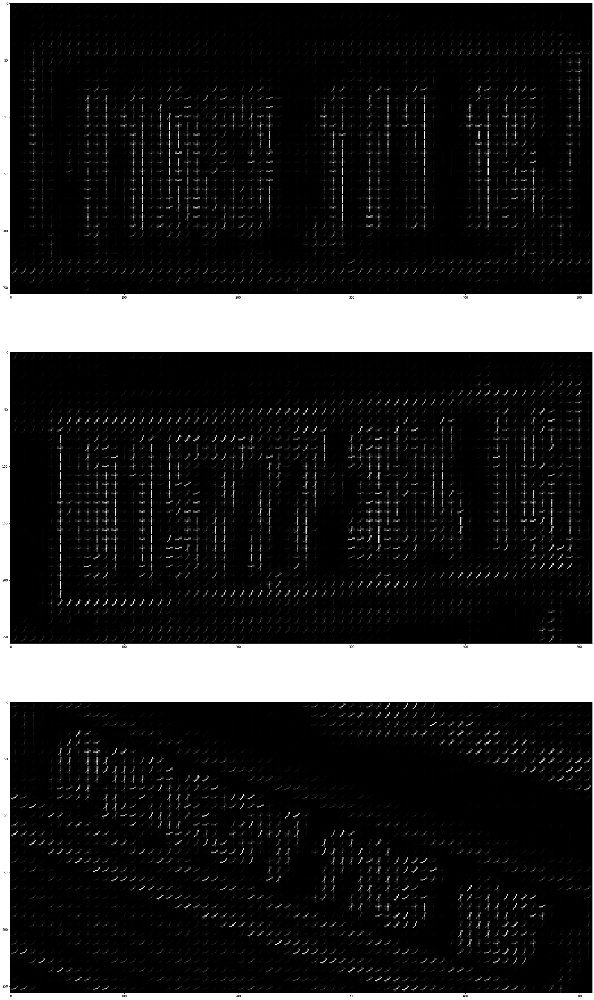

In [ ]:
show_multiple_images(hogImages_model,1,3,60,60)

In [ ]:
# deviser les images par block16x16
def devideHistogramto16x16(histogram,height,width) :
    histogram16x16 = []
    hist = []
    i = 0
    while (i<((width/8)*((height/8)-1))) :
        hist.append(histogram[i].tolist())
        hist.append(histogram[i+1].tolist())
        hist.append(histogram[i+int(width/8)].tolist())
        hist.append(histogram[i+int(width/8)+1].tolist())
        hist1 = np.ravel(hist)
        histogram16x16.append(hist1.tolist())
        hist =[]
        i = i+1
        if((i+1)%(width/8)==0) :
            i =i+1
    return histogram16x16


In [ ]:
# deviser les images par block16x16
def devideHistogramto16x16(histogram,height,width) :
    histogram16x16 = []
    hist = []
    i = 0
    while (i<((width/8)*((height/8)-3))) :
        hist.append(histogram[i].tolist())
        hist.append(histogram[i+1].tolist())
        hist.append(histogram[i+2].tolist())
        hist.append(histogram[i+3].tolist())
        hist.append(histogram[i+int(width/8)].tolist())
        hist.append(histogram[i+int(width/8)+1].tolist())
        hist.append(histogram[i+int(width/8)+2].tolist())
        hist.append(histogram[i+int(width/8)+3].tolist())
        hist1 = np.ravel(hist)
        histogram16x16.append(hist1.tolist())
        hist =[]
        i = i+1
        if((i+3)%(width/8)==0) :
            i =i+3
    return histogram16x16

In [ ]:
def histogram16x16Application(allHogHistogram,images):
  allHogHistogram16x16 = []
  for i in range (0,len(allHogHistogram)) :
      allHogHistogram16x16.append(devideHistogramto16x16(allHogHistogram[i],images[0].shape[0],images[0].shape[1]))
  return allHogHistogram16x16
allHogHistogram16x16_model = histogram16x16Application(allHogHistogram_model,resized_images_hog_model)

In [ ]:
print(len(allHogHistogram16x16_model[0]))

465


In [ ]:
#calculer root
def calculK(V) :
    sum = 0
    for i  in  range (0,len(V)):
        sum = sum + V[i]*V[i]
    return np.sqrt(sum + pow(1e-5,2))

In [ ]:
# normaliser le block par la methode='L2'
def normaliseVector(V) :
    K = calculK(V)
    for i in range(0,len(V)):
        V[i] = V[i] / K
    return V

def normaliseHist(histogram) :
    B = []
    for i in range(0,len(histogram)) :
        histogram[i] = normaliseVector(histogram[i])
    for j in range(len(histogram)):
      for k in range(len(histogram[j])):
          B.append(histogram[j][k])
    return B


In [ ]:
# normaliser les histograme 16x16
def normalisationApplication(allHogHistogram16x16):
  allHogHistogramNormalised = []
  B =[]
  for i in range(0,len(allHogHistogram16x16)):
      allHogHistogramNormalised.append(normaliseHist(allHogHistogram16x16[i]))

  return allHogHistogramNormalised
allHogHistogramNormalised_model = normalisationApplication(allHogHistogram16x16_model)


In [ ]:
print(len(allHogHistogramNormalised_model[0]))

167796


In [ ]:
# fonction pour calculer mse
def mse (hist1,hist2) :
    sum = 0
    n = len(hist1)
    for i in range (n):
            diff = hist1[i] - hist2[i]
            squared_diff = diff**2
            sum = sum + squared_diff
    MSE = sum/(n)
    return MSE

In [ ]:
# fonction pour calculer mse
def mse (hist1,hist2) :
    sum = 0
    n = len(hist1)
    for i in range (n):
            diff = hist1[i] - hist2[i]
            if(diff<0):
              diff = diff*-1
            if(diff>0.5):
              diff = 1
            sum = sum + diff
    MSE = sum/(n)
    return MSE

In [ ]:
#application Hog sur les images requette
grays_hog_requet = makeItAllGray(mat2_for_hog)
# grays_hog_requet = AjouterPixelBorder(grays_hog_requet)
resized_images_hog_requet = resizeImgs(grays_hog_requet)
gradX_requet = ImageToGradX(resized_images_hog_requet)
gradY_requet = ImageToGradY(resized_images_hog_requet)
magni_requet = magnitudeApplication(gradX_requet,gradY_requet,resized_images_hog_requet)
dir_requet = directionApplication(gradX_requet,gradY_requet,resized_images_hog_requet)
allHogHistogram_requet =  histogramApplication(dir_requet,magni_requet)
hogImages_requet = drawAllHogImages(allHogHistogram_requet,resized_images_hog_requet)
allHogHistogram16x16_requet = histogram16x16Application(allHogHistogram_requet,resized_images_hog_requet)
allHogHistogramNormalised_requet = normalisationApplication(allHogHistogram16x16_requet)

In [ ]:
show_multiple_images(hogImages_requet,3,12,64,128)

In [ ]:
plt.figure(figsize = (10,10))
plt.subplot(2,2,1)
plt.imshow(mat2_for_hog[1], cmap = 'gray')
plt.title("matricule requete "+str(i))
plt.subplot(2,2,2)
plt.title("matricule model "+str(k)+" ---- mse = "+str(minMse))
plt.imshow(mat_for_hog[6],cmap='gray')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


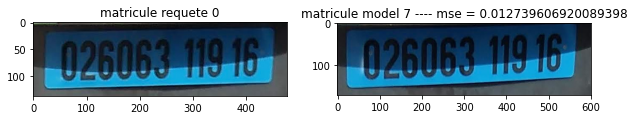

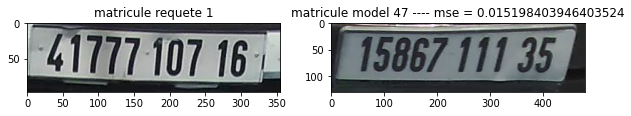

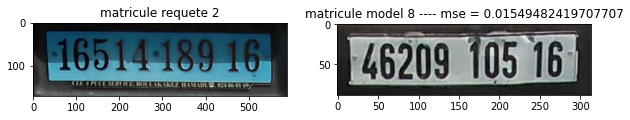

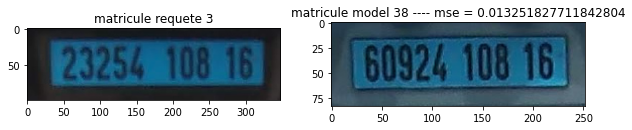

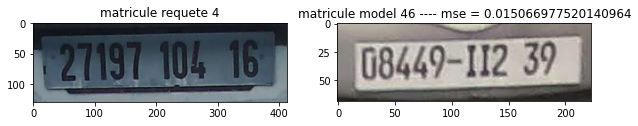

...

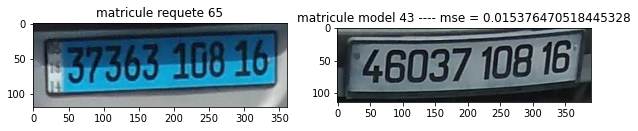

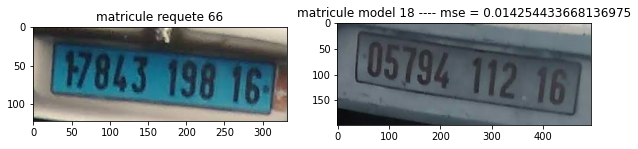

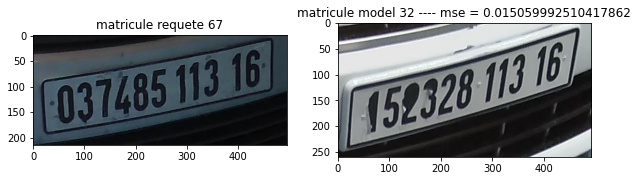

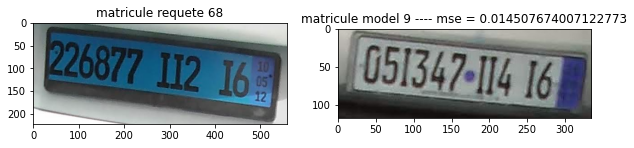

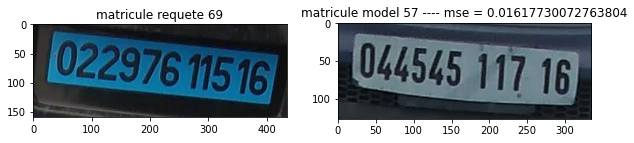

In [ ]:
m=0
# comparer entre les discripteurs des images requet et model
for i in range(len(allHogHistogramNormalised_requet)):
  mseList =[]
  for j in range(len(allHogHistogramNormalised_model)):
    MSE = mse(allHogHistogramNormalised_requet[i],allHogHistogramNormalised_model[j])
    mseList.append(MSE)
  minMse = min(mseList)

  for k in range(len(mseList)):
    if ((mseList[k]== minMse)):
      # print(m)
      # m = m + 1
      plt.figure(figsize = (10,10))
      plt.subplot(2,2,1)
      plt.imshow(mat2_for_hog[i], cmap = 'gray')
      plt.title("matricule requete "+str(i))
      plt.subplot(2,2,2)
      plt.title("matricule model "+str(k)+" ---- mse = "+str(minMse))
      plt.imshow(mat_for_hog[k],cmap='gray')



In [ ]:
show_multiple_images(mat_for_hog,10,7,60,60)

#4.1- Résultat HOG
Taux de réussite=0.4 et peut aller jusqu'à 0.5